In [1]:
!pip install opencv-python

In [2]:
import cv2 
import glob
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['image.cmap'] = 'gray'

## Read and Display Satellite Images

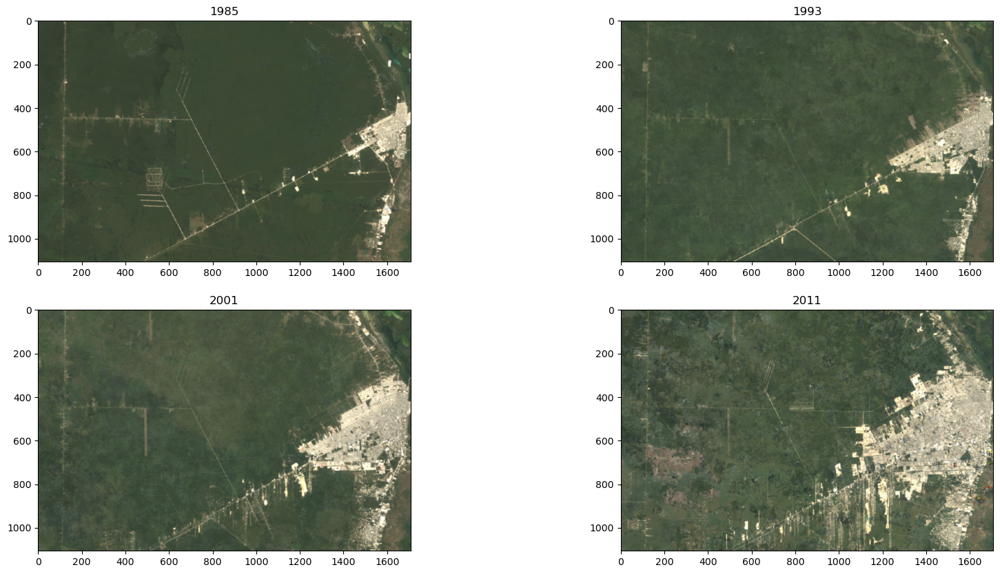

In [3]:
image1 = cv2.imread(r"C:\Users\ASUS\Downloads\Deforestration applicatipn\1985.png")
image2 = cv2.imread(r"C:\Users\ASUS\Downloads\Deforestration applicatipn\1993.png")
image3 = cv2.imread(r"C:\Users\ASUS\Downloads\Deforestration applicatipn\2001.png")
image4 = cv2.imread(r"C:\Users\ASUS\Downloads\Deforestration applicatipn\2011.png")


fig = plt.figure(figsize=[20, 10])

ax = fig.add_subplot(2, 2, 1)
ax.set_title('1985')
plt.imshow(image1[:, :, ::-1])

ax = fig.add_subplot(2, 2, 2)
ax.set_title('1993')
plt.imshow(image2[:, :, ::-1])

ax = fig.add_subplot(2, 2, 3)
ax.set_title('2001')
plt.imshow(image3[:, :, ::-1])

ax = fig.add_subplot(2, 2, 4)
ax.set_title('2011')
plt.imshow(image4[:, :, ::-1])
plt.show()


## Visualize Channels

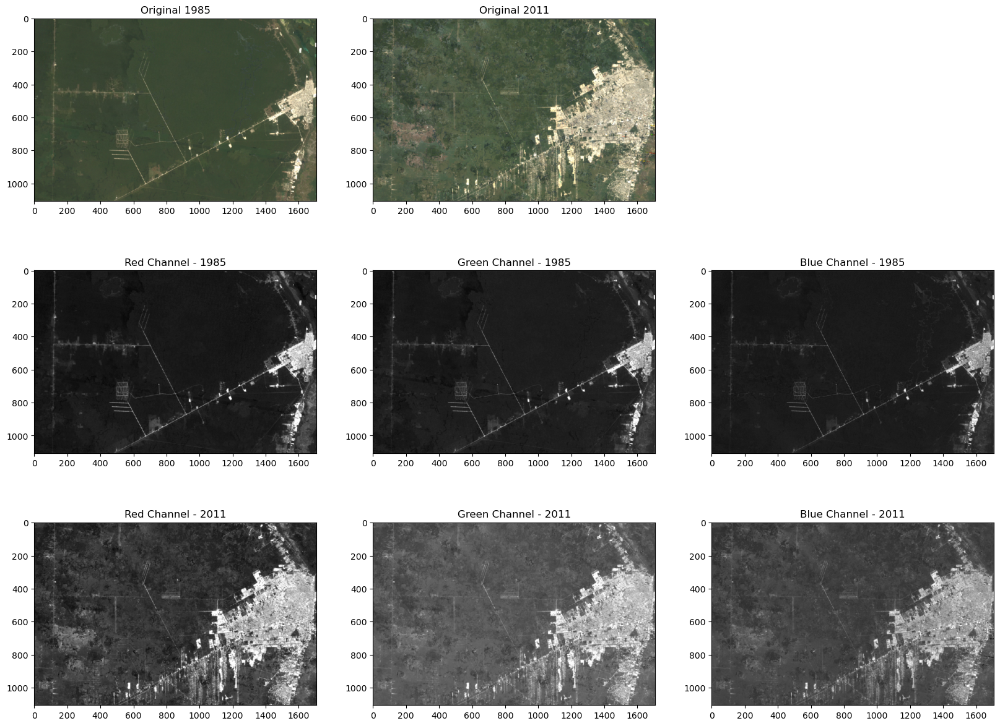

In [4]:
b1, g1, r1 = cv2.split(image1)
b4, g4, r4 = cv2.split(image4)

# Show the channels.
plt.figure(figsize = [20, 15])
plt.subplot(331); plt.imshow(image1[:, :, ::-1]); plt.title('Original 1985')
plt.subplot(332); plt.imshow(image4[:, :, ::-1]); plt.title('Original 2011')

plt.subplot(334); plt.imshow(r1); plt.title('Red Channel - 1985')
plt.subplot(335); plt.imshow(g1); plt.title('Green Channel - 1985')
plt.subplot(336); plt.imshow(b1); plt.title('Blue Channel - 1985')

plt.subplot(337); plt.imshow(r4); plt.title('Red Channel - 2011')
plt.subplot(338); plt.imshow(g4); plt.title('Green Channel - 2011')
plt.subplot(339); plt.imshow(b4); plt.title('Blue Channel - 2011')
plt.show()

##  Histogram Analysis

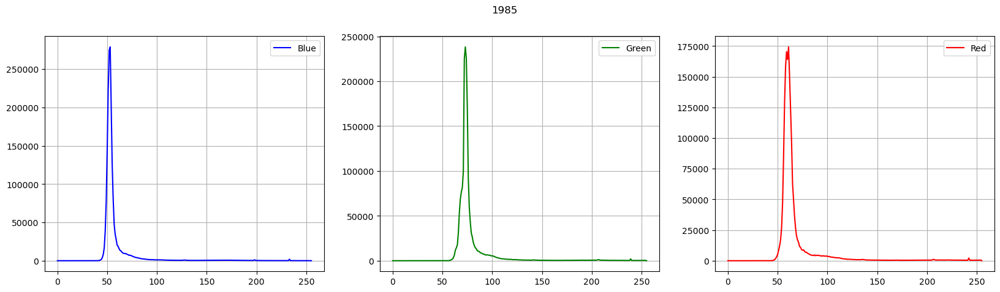

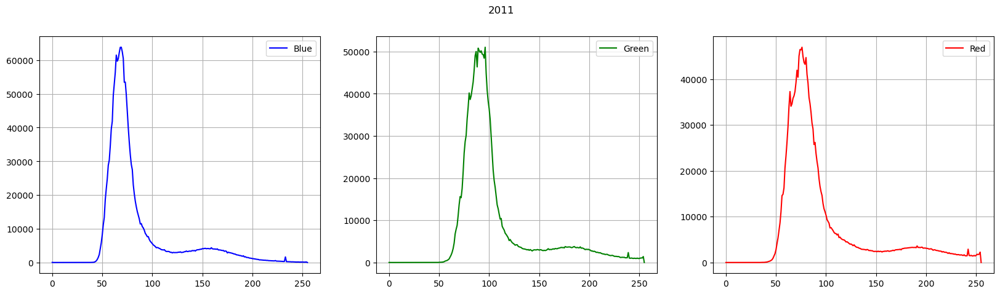

In [15]:
def draw_image_histogram_bgr(image, title = '', yscale = 'linear'):
    """Utility to plot bgr histograms for all color channels independently."""
    histB = cv2.calcHist([image], [0], None, [256], [0, 255])
    histG = cv2.calcHist([image], [1], None, [256], [0, 255])
    histR = cv2.calcHist([image], [2], None, [256], [0, 255])
    
    # Plot the histograms for each channel.
    fig = plt.figure(figsize = [20, 5])
    fig.suptitle(title)
    
    ax = fig.add_subplot(1, 3, 1)
    ax.set_yscale(yscale)
    plt.plot(histB, color = 'b', label = 'Blue')
    ax.grid()
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 2)
    ax.set_yscale(yscale)
    plt.plot(histG, color = 'g', label = 'Green')
    ax.grid()
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 3)
    ax.set_yscale(yscale)
    plt.plot(histR, color = 'r', label = 'Red')
    ax.grid()
    ax.legend()
    
    plt.show()

# Calculate and draw the histograms for the images.
draw_image_histogram_bgr(image1, '1985')
draw_image_histogram_bgr(image4, '2011')

## Color Segmentation using inRange

In [16]:
def detect_green_BGR(img):
    """Detect and return a mask for the green area of an image using BGR segmentation."""
    lower_BGR_values = np.array([0, 50, 0], dtype = 'uint8')
    upper_BGR_values = np.array([255, 100, 255], dtype = 'uint8')
    
    # Create a mask using the lower and upper range.
    mask_BGR = cv2.inRange(img, lower_BGR_values, upper_BGR_values) 

    return mask_BGR

## Visualize Segmented Output

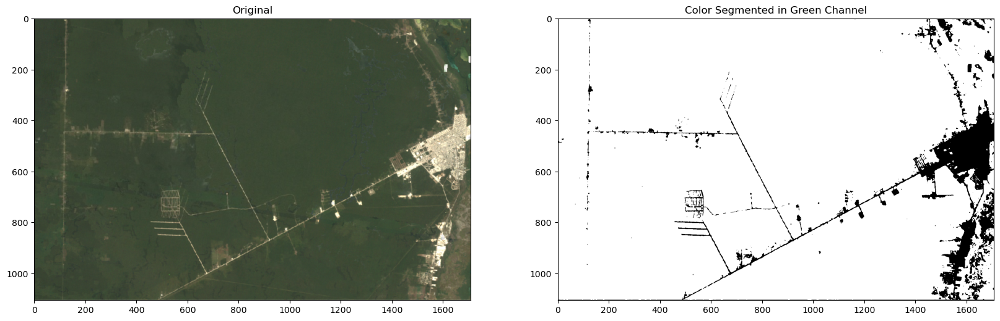

In [17]:
segmented_green = detect_green_BGR(image1)

fig = plt.figure(figsize = (20, 10))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1[:, :, ::-1])
ax.set_title('Original')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(segmented_green, cmap = 'gray')
ax.set_title('Color Segmented in Green Channel')

plt.show()

## Calculate Percentage of Forested Area

In [18]:
def percent_forest(gray_img):
    """Return the percentage of the image detected to be forested."""
    c = cv2.countNonZero(gray_img) # non-zerop pixels

    # Finding number of pixels in image to find percentage.
    t = gray_img.shape[0] * gray_img.shape[1] # total number of pixels

    # Rounding off to 2 decimal place.
    return round((c / t) * 100, 2)

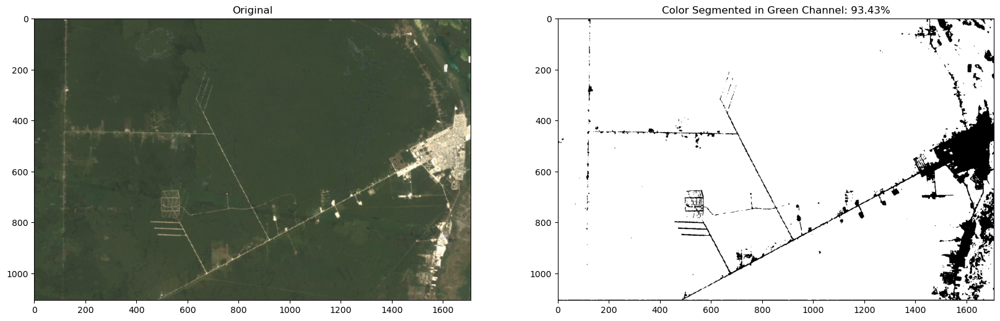

In [19]:
segmented_green = detect_green_BGR(image1)
green_ratio = percent_forest(segmented_green)

fig = plt.figure(figsize = (20, 20))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1[:, :, ::-1])
ax.set_title('Original')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(segmented_green, cmap = 'gray')
ax.set_title('Color Segmented in Green Channel: ' + str(green_ratio) + '%')

plt.show()

##  Explore Deforestation Trends

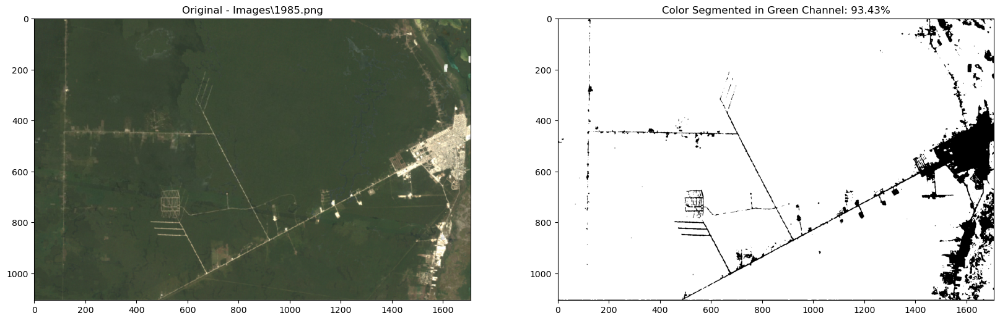

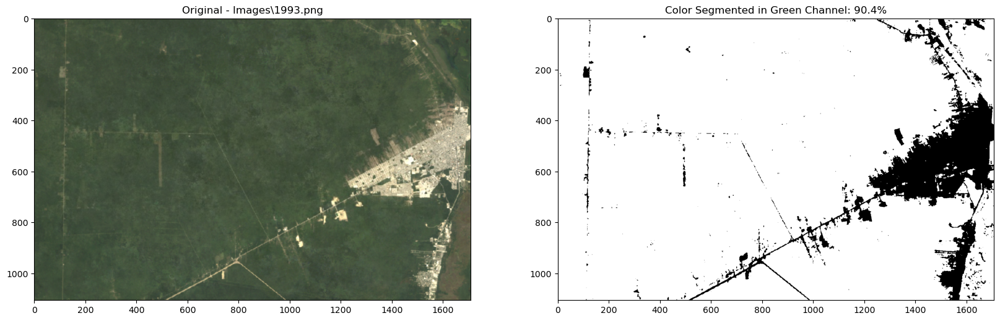

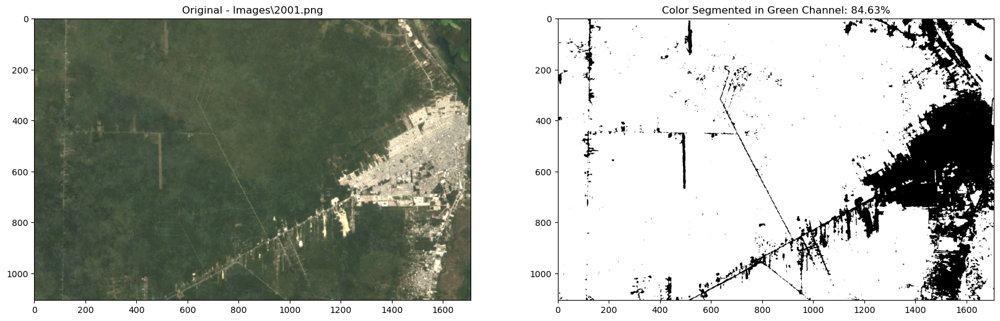

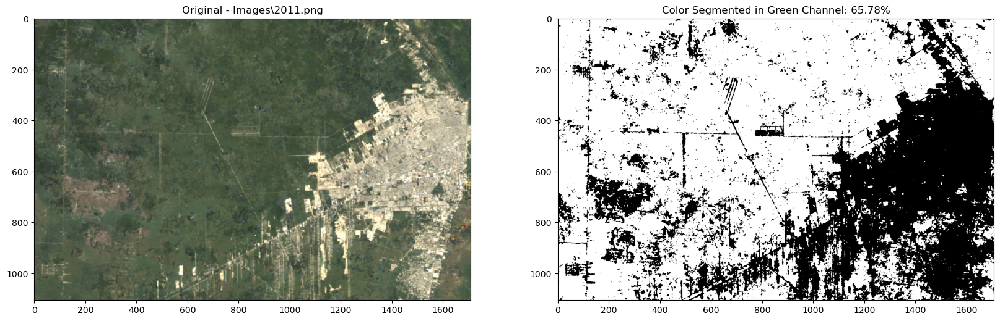

In [20]:
image_files = glob.glob("Images/*.png")
image_files.sort()
for image_file in image_files: 
    image = cv2.imread(image_file)
    
    segmented_green = detect_green_BGR(image)
    green_ratio = percent_forest(segmented_green)

    fig = plt.figure(figsize = (20, 10))
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(image[:, :, ::-1])
    ax.set_title('Original - ' + image_file)
    
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(segmented_green, cmap = 'gray')
    ax.set_title('Color Segmented in Green Channel: ' + str(green_ratio) + '%')
    %matplotlib inline
    plt.show()

## Utilizing HSV Color Space

In [21]:
def draw_image_histogram_hsv(image, title = '', yscale = 'linear'):
    """Utility to plot histograms for the hue, saturation, value channels independently."""
    HSV_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    histH = cv2.calcHist([HSV_image], [0], None, [180], [0, 179])
    histS = cv2.calcHist([HSV_image], [1], None, [256], [0, 255])
    histV = cv2.calcHist([HSV_image], [2], None, [256], [0, 255])
    
    # Plot the histograms for each channel.
    fig = plt.figure(figsize = [20, 5])
    fig.suptitle(title)
    
    ax = fig.add_subplot(1, 3, 1)
    ax.set_yscale(yscale)
    plt.plot(histH, color = 'b', label = 'Hue')
    ax.grid()
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 2)
    ax.set_yscale(yscale)
    plt.plot(histS, color = 'g', label = 'Saturation')
    ax.grid()
    ax.legend()
    
    ax = fig.add_subplot(1, 3, 3)
    ax.set_yscale(yscale)
    plt.plot(histV, color = 'r', label = 'Value')
    ax.grid()
    ax.legend()
    
    plt.show()

## Segmented Output from HSV Image

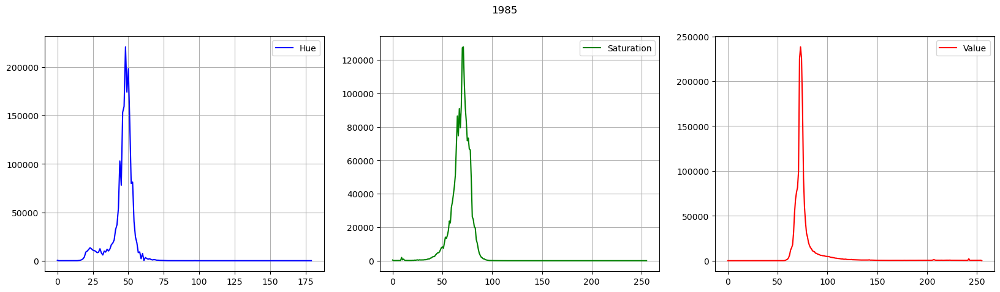

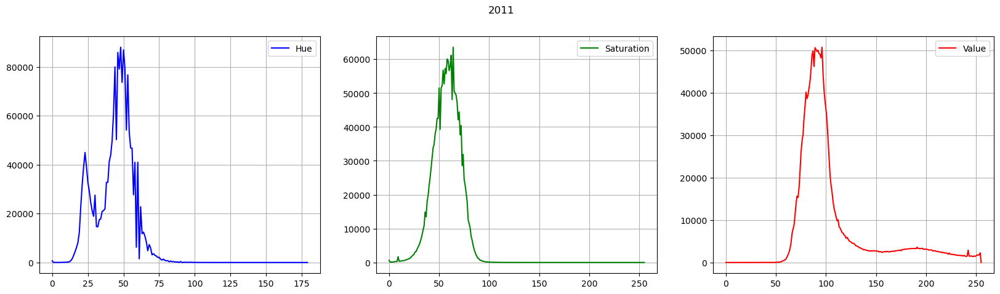

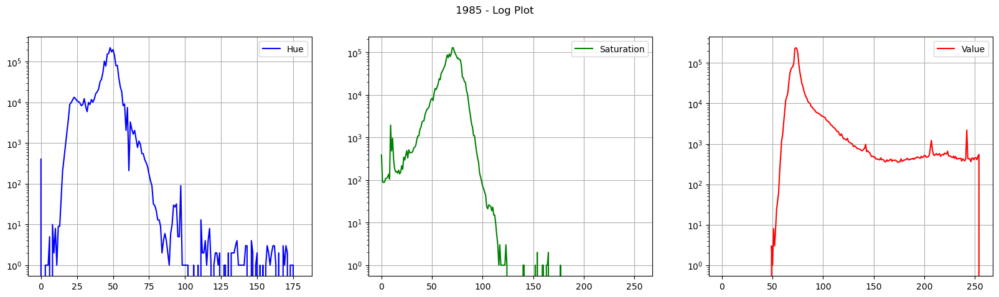

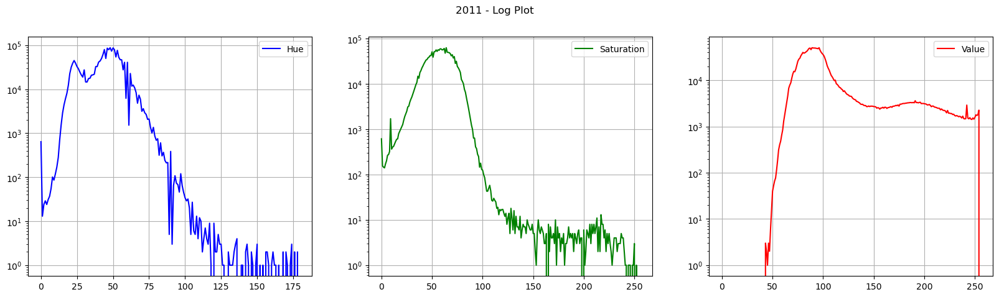

In [22]:
# calculate and draw the histograms for the images
draw_image_histogram_hsv(image1, '1985')
draw_image_histogram_hsv(image4, '2011')

# Display the Log plots
draw_image_histogram_hsv(image1, '1985 - Log Plot','log')
draw_image_histogram_hsv(image4, '2011 - Log Plot','log')
    

## Comparison with BGR

In [23]:
def detect_green_HSV(img):
    """Detect and return a mask for the green area of an image using HSV segmentation."""
    HSV_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    lower_HSV_values = np.array([36, 0, 50], dtype = 'uint8')
    upper_HSV_values = np.array([86, 250, 100], dtype = 'uint8')
    
    mask_HSV = cv2.inRange(HSV_image, lower_HSV_values, upper_HSV_values) 
    
    return mask_HSV

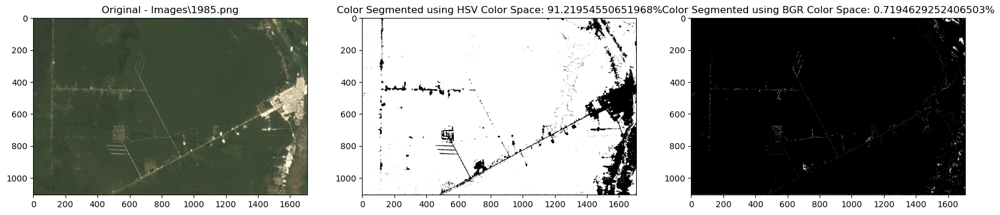

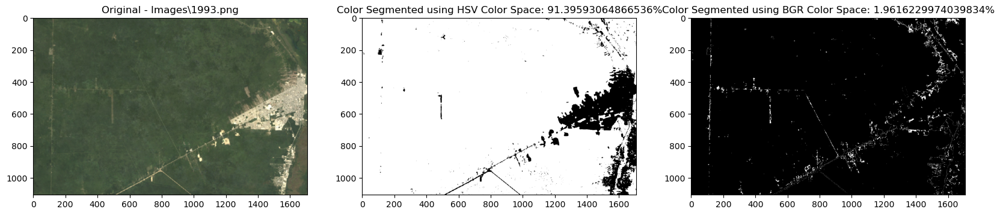

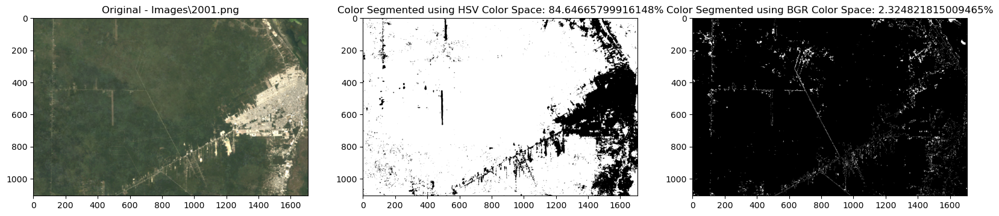

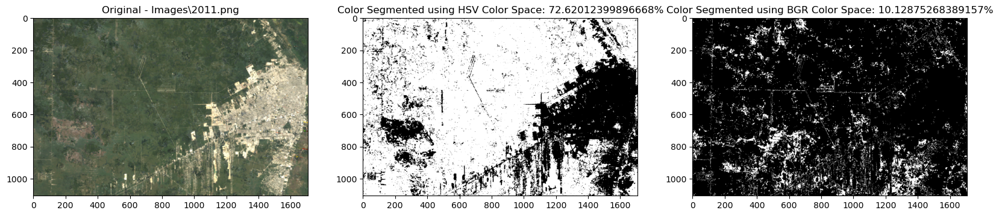

In [25]:
image_files = glob.glob("Images/*.png")
image_files.sort()
for image_file in image_files: 
    image = cv2.imread(image_file)
    
    segmented_green_hsv = detect_green_HSV(image)
    green_ratio_hsv = percent_forest(segmented_green_hsv)
    
    segmented_green_bgr = detect_green_BGR(image)
    green_ratio_bgr = percent_forest(segmented_green_bgr)

    fig = plt.figure(figsize = (20, 10))
    ax = fig.add_subplot(1, 3, 1)
    plt.imshow(image[:, :, ::-1])
    ax.set_title('Original - ' + image_file)
    
    ax = fig.add_subplot(1, 3, 2)
    plt.imshow(segmented_green_hsv, cmap = 'gray')
    ax.set_title('Color Segmented using HSV Color Space: ' + str(green_ratio_hsv) + '%')
    
    ax = fig.add_subplot(1, 3, 3)
    plt.imshow(segmented_green_bgr, cmap = 'gray')
    ax.set_title('Color Segmented using BGR Color Space: ' + str(green_ratio_bgr) + '%')
    
    plt.show()
